In [1]:
#importing necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import scipy.linalg as la
import sys
from sklearn.metrics import r2_score


In [2]:
#reading raw data from NASS

raw_honey_data = pd.read_csv("./data/HoneyData.csv", thousands=',') #data for each state

national_honey_production = pd.read_csv("./data/NationalHoneyProduction.csv", thousands=',') #national data


In [3]:
# Important headers: Year, State, State ANSI, Data Item, Value
selective_honey_data = raw_honey_data[['Year', 'State', 'State ANSI', 'Data Item', 'Value']]
national_honey_production = national_honey_production[['Year', 'Data Item', 'Value']]
national_honey_production['Data Item'].unique()

array(['HONEY - PRODUCTION, MEASURED IN $',
       'HONEY - PRODUCTION, MEASURED IN LB',
       'HONEY - PRODUCTION, MEASURED IN LB / COLONY'], dtype=object)

In [4]:
#converting data into appropriate data types

selective_honey_data['Value'] = selective_honey_data['Value'].astype(float)
selective_honey_data['Year'] = selective_honey_data['Year'].astype(int)

national_honey_production['Value'] = national_honey_production['Value'].astype(float)
national_honey_production['Year'] = national_honey_production['Year'].astype(int)

C:\Users\ahnaf\AppData\Local\Temp\ipykernel_24280\1891838908.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selective_honey_data['Value'] = selective_honey_data['Value'].astype(float)
C:\Users\ahnaf\AppData\Local\Temp\ipykernel_24280\1891838908.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selective_honey_data['Year'] = selective_honey_data['Year'].astype(int)


In [5]:
# seperate HONEY - PRICE RECEIVED MEASURED IN $ / LB | HONEY - PRODUCTION, MEASURED IN $ | HONEY - PRODUCTION, MEASURED IN LB | HONEY - PRODUCTION, MEASURED IN LB / COLONY

#Honey Production
honey_prod_dollar = selective_honey_data[selective_honey_data['Data Item'] == 'HONEY - PRODUCTION, MEASURED IN $']
honey_prod_Lb = selective_honey_data[selective_honey_data['Data Item'] == 'HONEY - PRODUCTION, MEASURED IN LB']
honey_prod_LbPerColony = selective_honey_data[selective_honey_data['Data Item'] == 'HONEY - PRODUCTION, MEASURED IN LB / COLONY']

#Honey Price Recieved
honey_pricePerPound = selective_honey_data[selective_honey_data['Data Item'] == 'HONEY - PRICE RECEIVED, MEASURED IN $ / LB']

#Checking if all rows are preserved
print(len(selective_honey_data.index))
print(len(honey_prod_dollar.index) + len(honey_prod_Lb) + len(honey_prod_LbPerColony) + len(honey_pricePerPound.index) )

#Check which years' data is available
print(f' honey production in dollars years: {honey_prod_dollar["Year"].unique()}')
print(f' honey production in pounds years: {honey_prod_Lb["Year"].unique()}')
print(f' honey production lb/colony years: {honey_prod_LbPerColony["Year"].unique()}')

print(honey_pricePerPound['Year'].unique())
print(honey_pricePerPound['Year'].value_counts())



4881
4881
 honey production in dollars years: [2022 2021 2020 2019 2018 2017 2016 2015 2014 2013 2012 2011 2010 2009
 2008 2007 2006 2005 2004 2003 2002 2001 2000 1999 1998 1997 1996 1995
 1994 1993 1992 1991 1990 1989 1988 1987]
 honey production in pounds years: [2022 2021 2020 2019 2018 2017 2016 2015 2014 2013 2012 2011 2010 2009
 2008 2007 2006 2005 2004 2003 2002 2001 2000 1999 1998 1997 1996 1995
 1994 1993 1992 1991 1990 1989 1988 1987]
 honey production lb/colony years: [2022 2021 2020 2019 2018 2017 2016 2015 2014 2013 2012 2011 2010 2009
 2008 2007 2006 2005 2004 2003 2002 2001 2000 1999 1998 1997 1996 1995
 1994 1993 1992 1991 1990 1989 1988 1987]
[2022 2021 2020 2019 2018]
2021    41
2020    41
2019    41
2018    41
2022    40
Name: Year, dtype: int64


In [6]:
#Filtering national honey production by Data Item

nhp_dollar = national_honey_production[national_honey_production['Data Item'] == 'HONEY - PRODUCTION, MEASURED IN $']
nhp_Lb = national_honey_production[national_honey_production['Data Item'] == 'HONEY - PRODUCTION, MEASURED IN LB']
nhp_LbPerColony = national_honey_production[national_honey_production['Data Item'] == 'HONEY - PRODUCTION, MEASURED IN LB / COLONY']

#Checking for missing data points
print(nhp_dollar.head())
print(len(nhp_dollar['Year'].unique()))
print(nhp_dollar['Year'].unique())
      
print()
      
      
print(nhp_Lb.head())
print(len(nhp_Lb['Year'].unique()))
print(nhp_Lb['Year'].unique())
      
print()
      
      
print(nhp_LbPerColony.head())
print(len(nhp_LbPerColony['Year'].unique()))
print(nhp_LbPerColony['Year'].unique())


    Year                          Data Item        Value
0   2022  HONEY - PRODUCTION, MEASURED IN $  370980000.0
3   2021  HONEY - PRODUCTION, MEASURED IN $  335872000.0
6   2020  HONEY - PRODUCTION, MEASURED IN $  309947000.0
9   2019  HONEY - PRODUCTION, MEASURED IN $  312275000.0
12  2018  HONEY - PRODUCTION, MEASURED IN $  340358000.0
36
[2022 2021 2020 2019 2018 2017 2016 2015 2014 2013 2012 2011 2010 2009
 2008 2007 2006 2005 2004 2003 2002 2001 2000 1999 1998 1997 1996 1995
 1994 1993 1992 1991 1990 1989 1988 1987]

    Year                           Data Item        Value
1   2022  HONEY - PRODUCTION, MEASURED IN LB  125331000.0
4   2021  HONEY - PRODUCTION, MEASURED IN LB  126744000.0
7   2020  HONEY - PRODUCTION, MEASURED IN LB  147594000.0
10  2019  HONEY - PRODUCTION, MEASURED IN LB  156922000.0
13  2018  HONEY - PRODUCTION, MEASURED IN LB  154008000.0
36
[2022 2021 2020 2019 2018 2017 2016 2015 2014 2013 2012 2011 2010 2009
 2008 2007 2006 2005 2004 2003 2002 2001 2000 19

C:\Users\ahnaf\AppData\Local\Temp\ipykernel_15340\1431030747.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (9, 9))


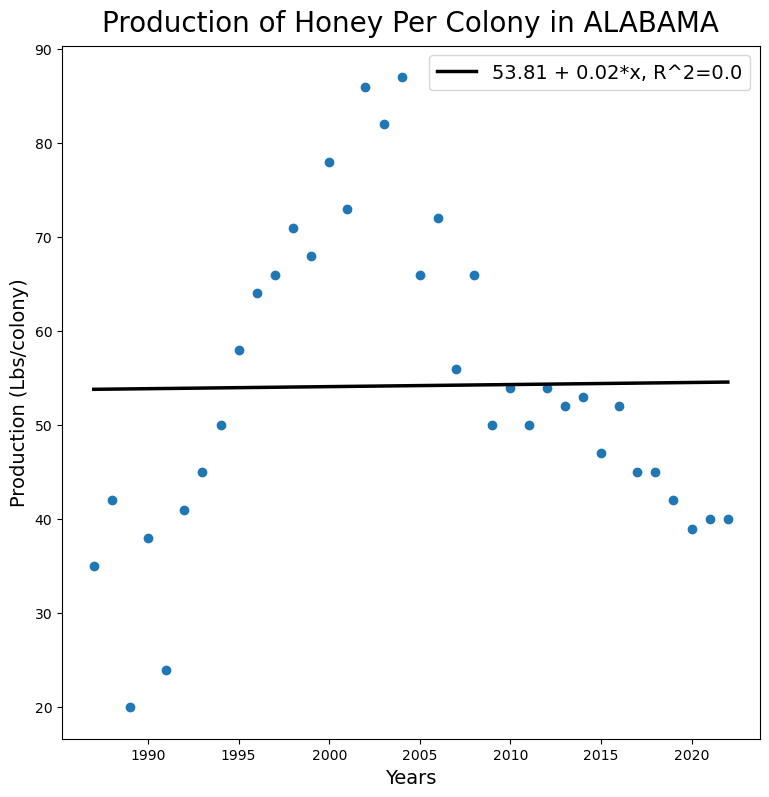

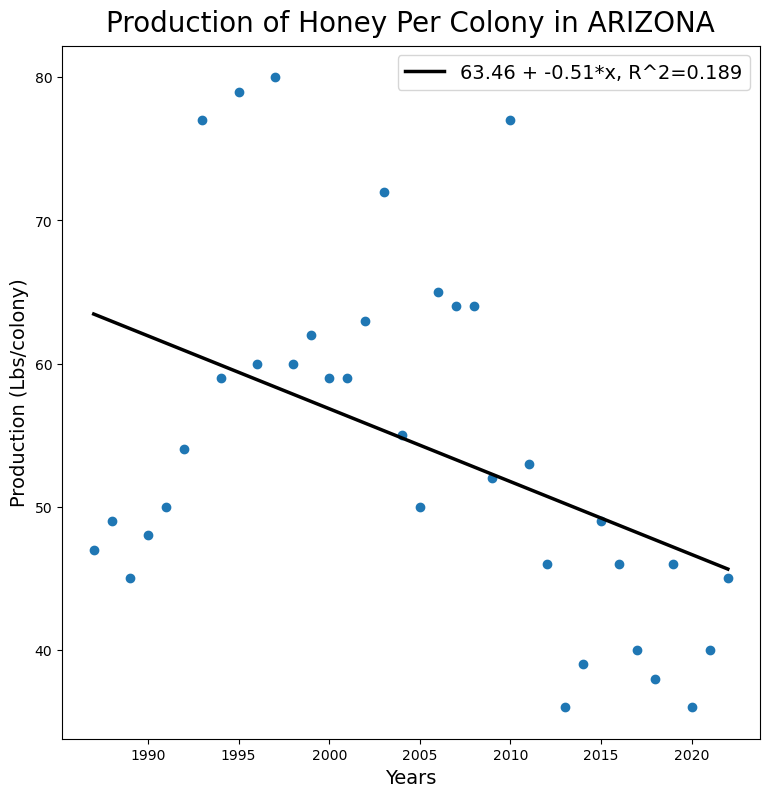

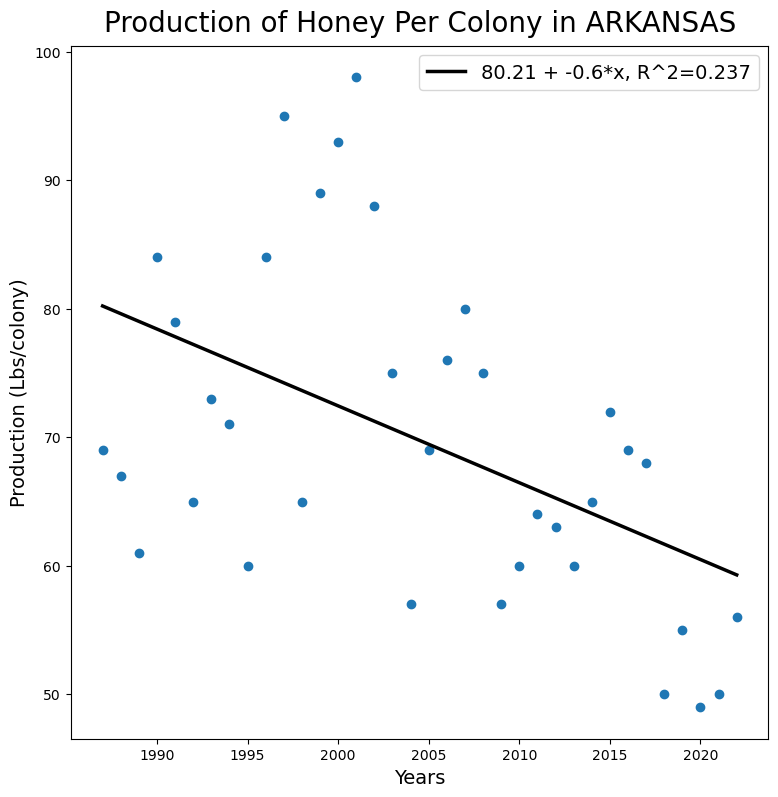

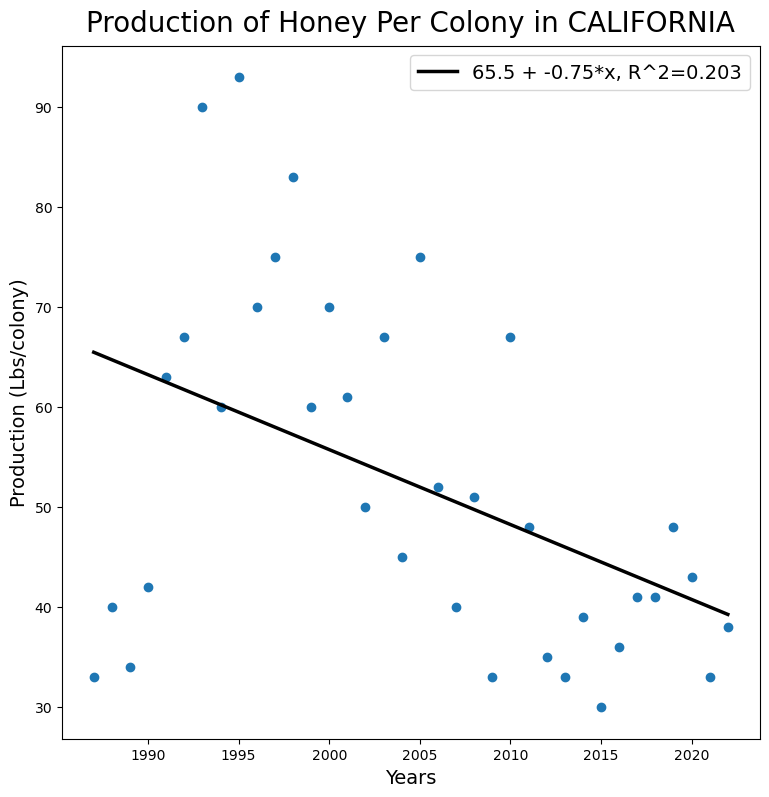

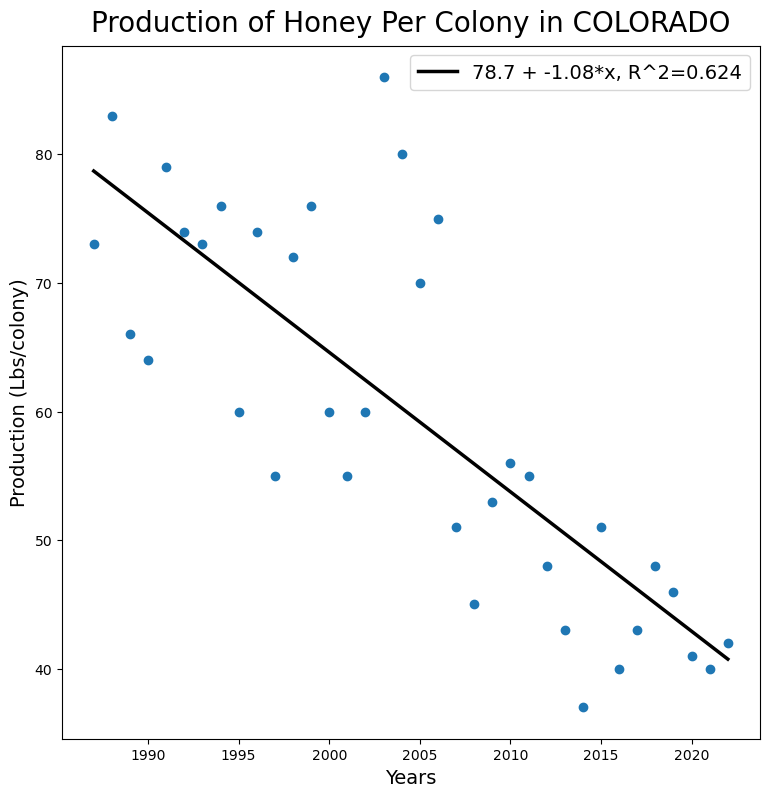

...

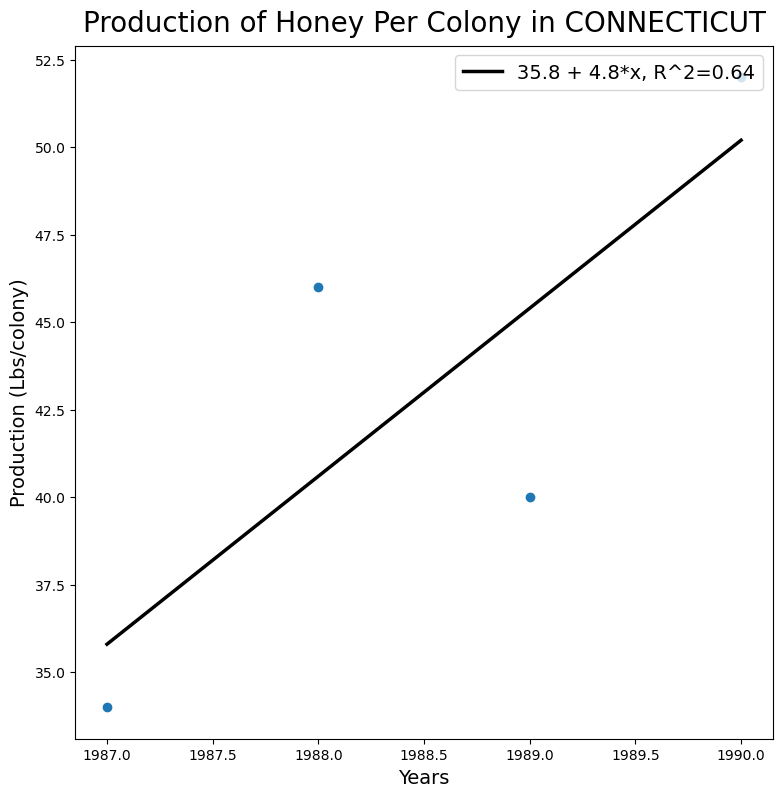

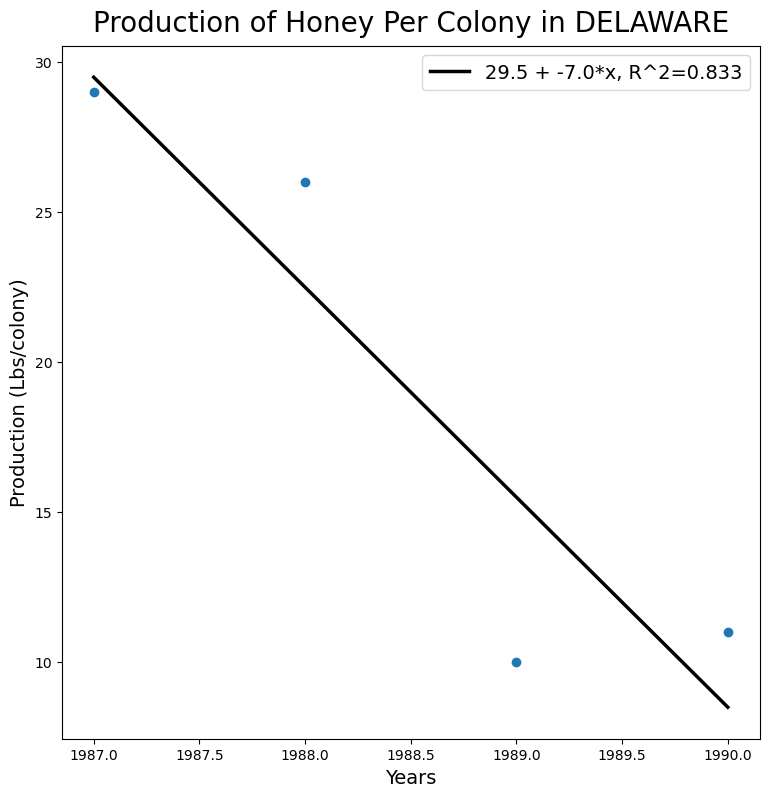

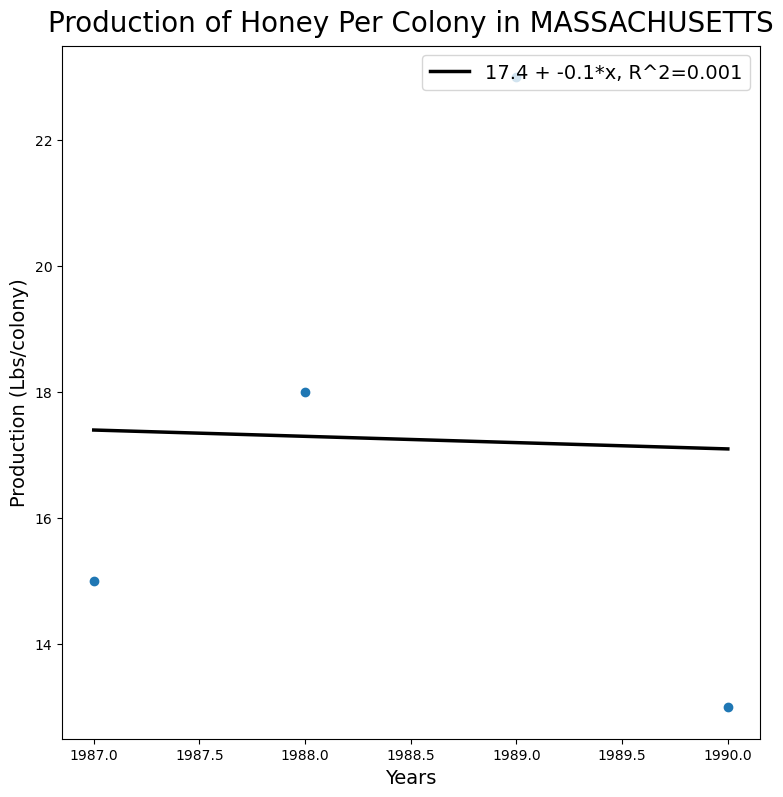

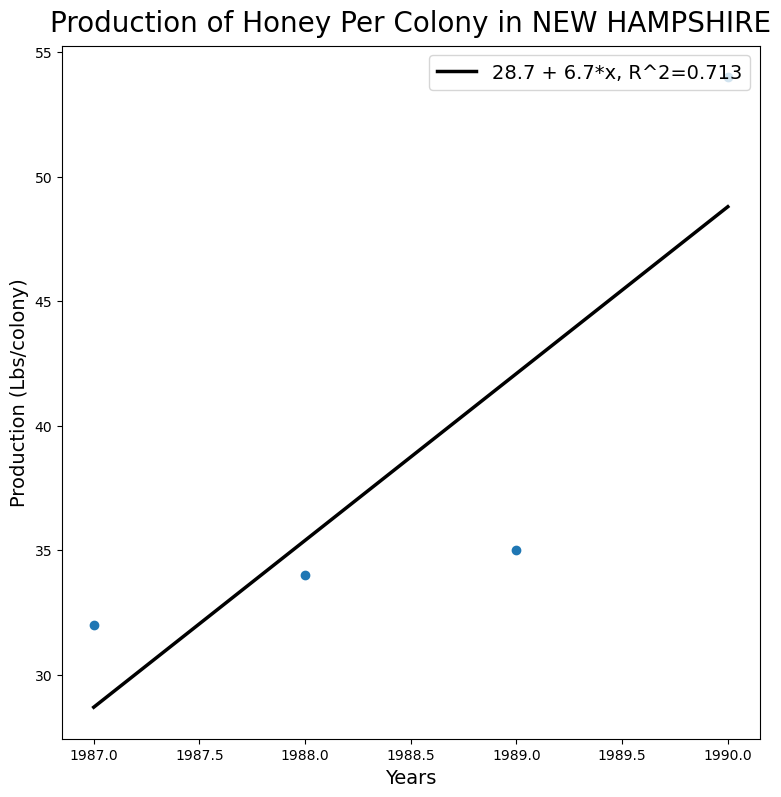

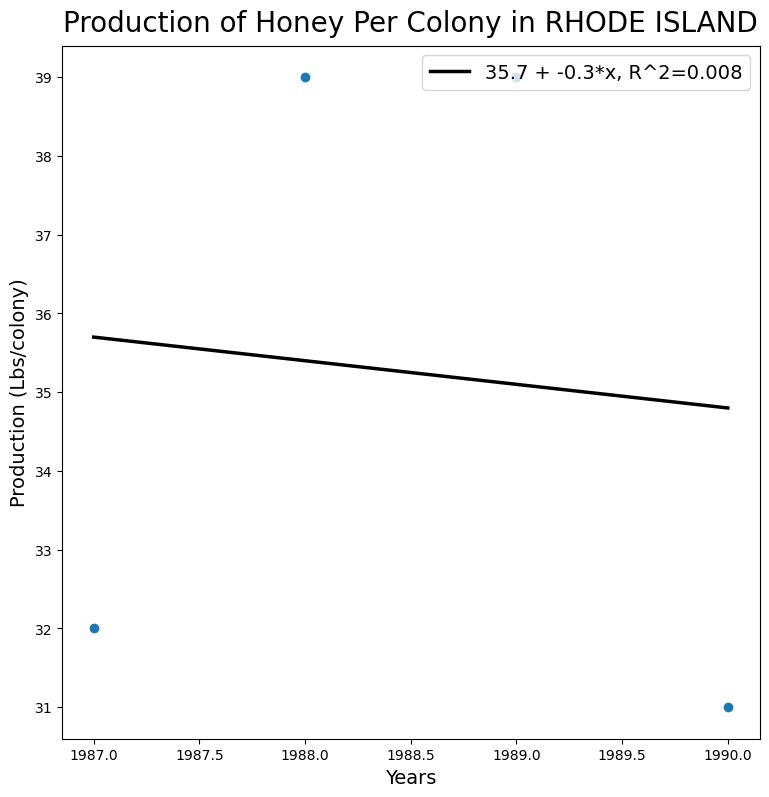

In [9]:
#Creating a scatterplot and line of regression for all states
#Honey Production (lbs/colony)
states = honey_prod_LbPerColony["State"].unique()


each_stateLbPerColony = pd.DataFrame(columns=['State', 'Beta'])

#looping through each unique state
for state in states:
    #selecting data for a particular state
    prod = honey_prod_LbPerColony[honey_prod_LbPerColony['State'] == state]
    
    
    #creating a plot
    fig, ax = plt.subplots(figsize = (9, 9))

    #plotting a scatterplot
    ax.scatter(x=prod['Year'], y=prod['Value'])

    #calculating line of best fit
    b, a = np.polyfit(prod['Year'], prod['Value'], deg=1)
    beta, alpha = np.polyfit(range(len(prod['Year'])), prod['Value'][::-1], deg=1)
    
    #Calculating R-squared value
    corr_matrix = np.corrcoef(range(len(prod['Year'])), prod['Value'][::-1])
    corr = corr_matrix[0,1]
    R_sq = corr**2
    
    
    #storing the state name and its regression coefficient in a separate dataframe
    row_to_append = pd.DataFrame({'State': state.title(), 'Beta': beta}, index=[0])
    each_stateLbPerColony = pd.concat([each_stateLbPerColony, row_to_append])
    
    #plotting a linear regression line =
    ax.plot(prod['Year'], a + b * prod['Year'], color="k", lw=2.5, label=f'{round(alpha, 2)} + {round(beta, 2)}*x, R^2={round(R_sq, 3)}')

    #Configuring chart labels
    ax.set_title(f"Production of Honey Per Colony in {state}", fontsize=20, verticalalignment='bottom')
    ax.set_xlabel("Years", fontsize=14)
    ax.set_ylabel("Production (Lbs/colony)", fontsize=14)
    ax.legend(loc="upper right", fontsize=14)
  






C:\Users\ahnaf\AppData\Local\Temp\ipykernel_21496\1718732539.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (9, 9))


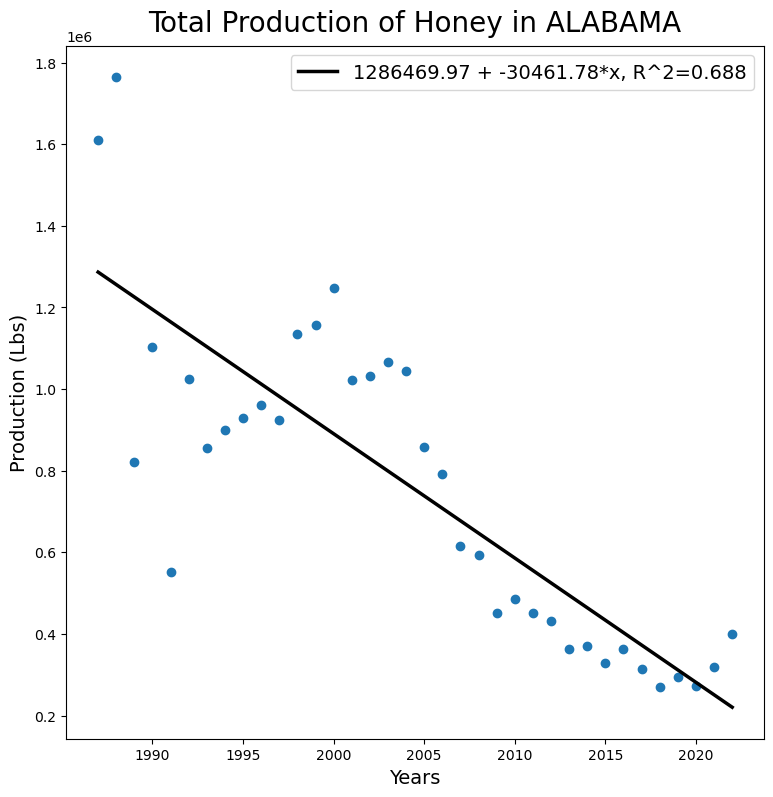

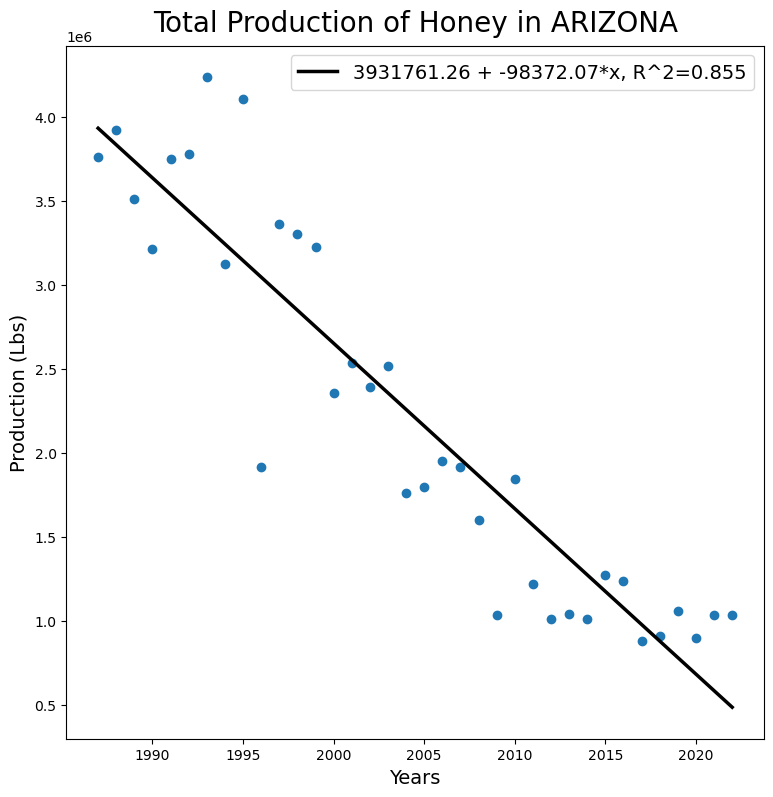

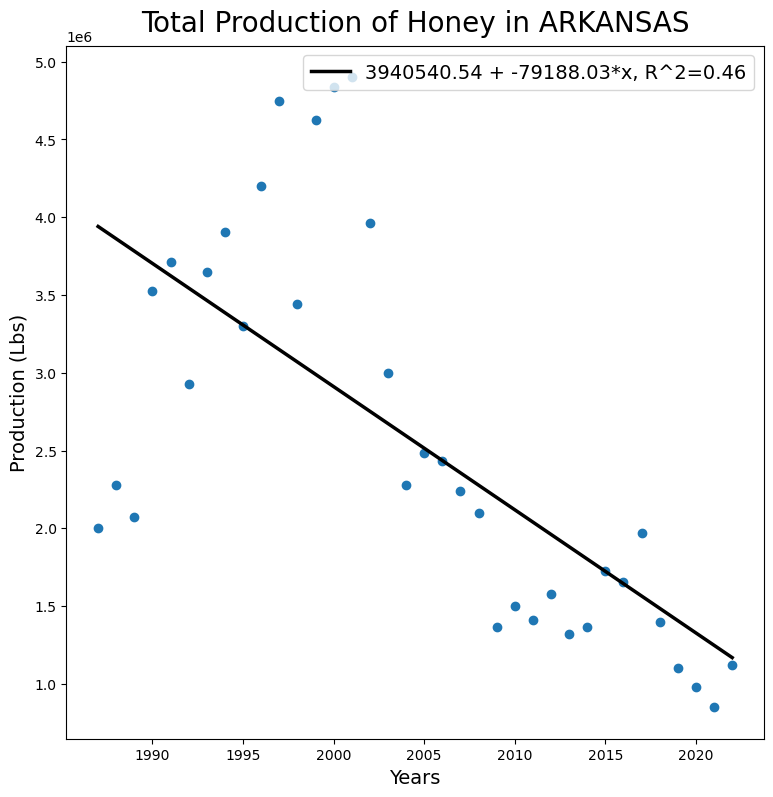

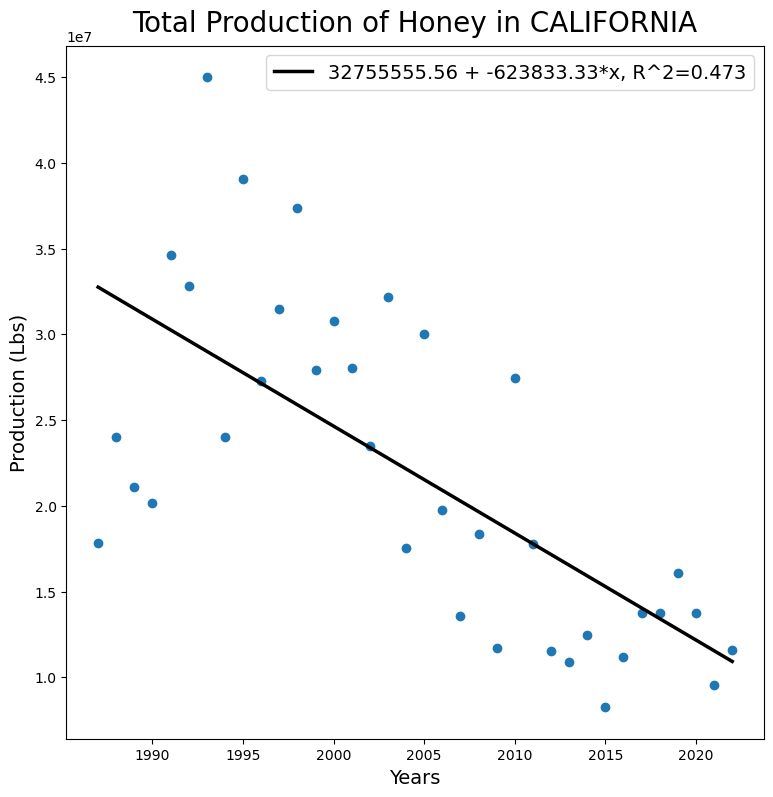

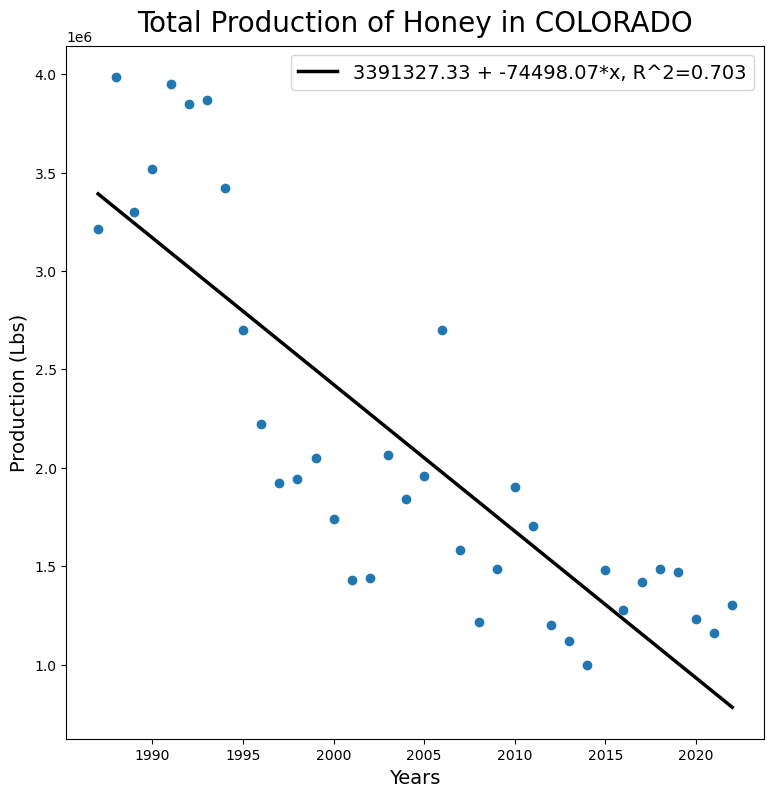

...

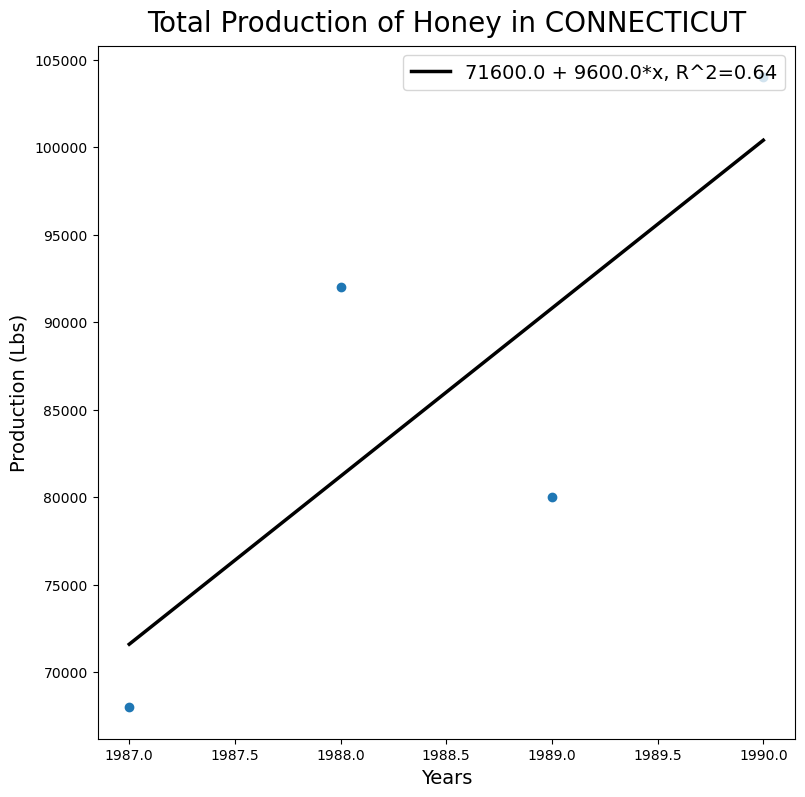

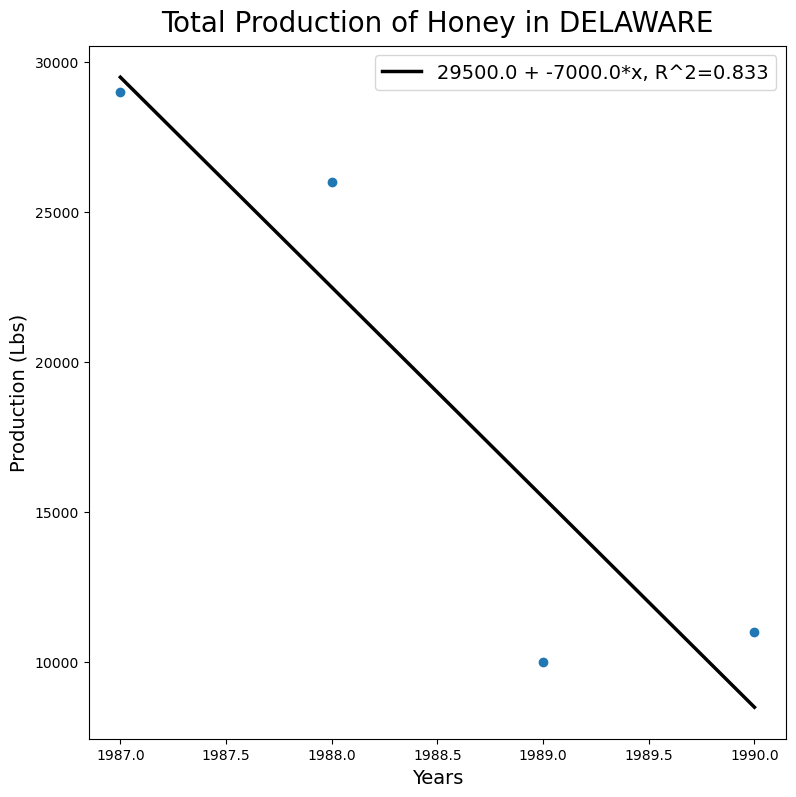

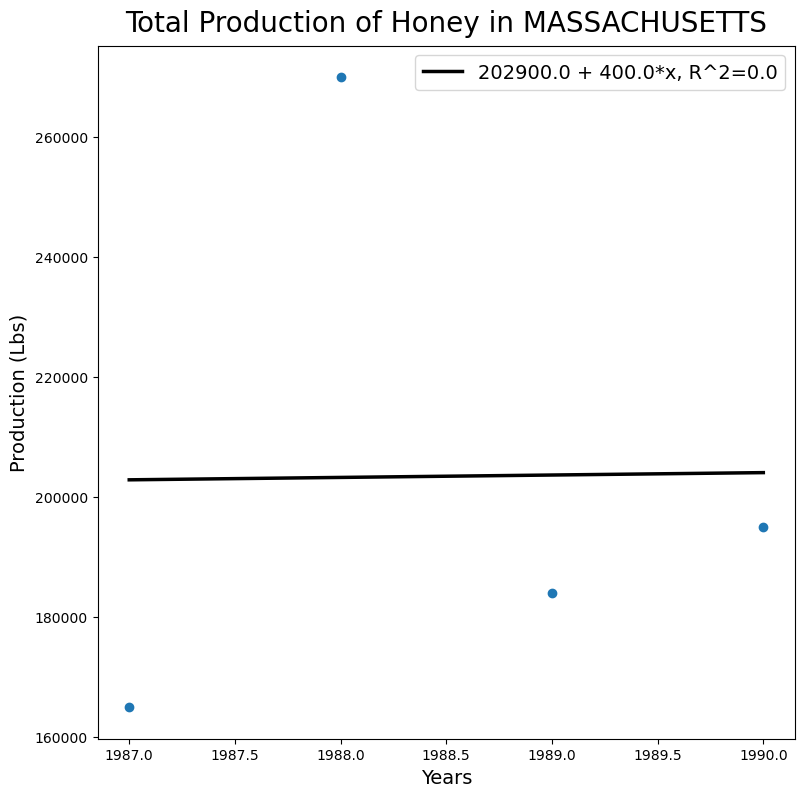

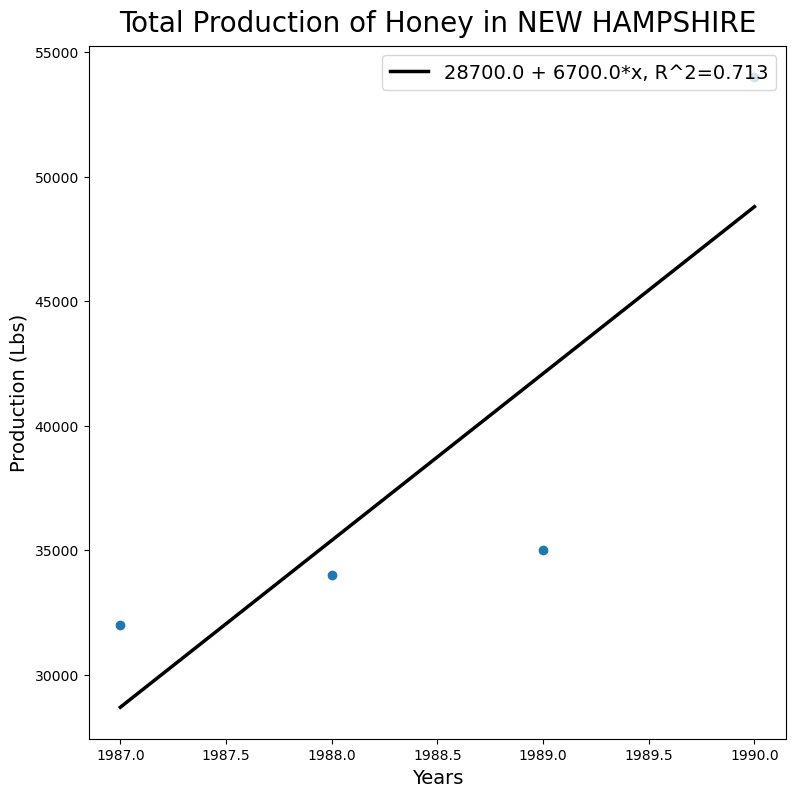

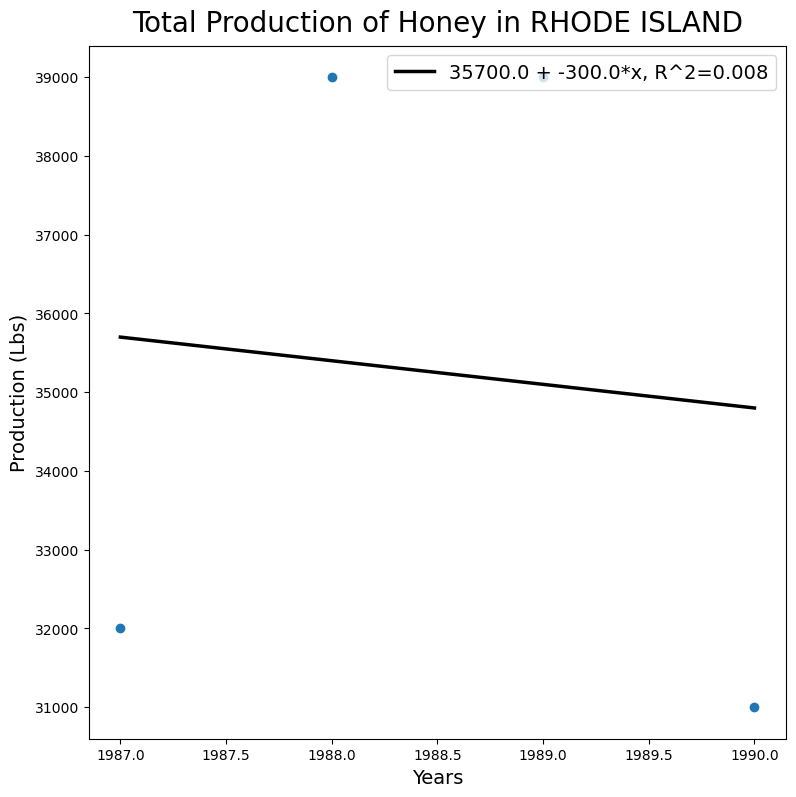

In [9]:
#Creating a scatterplot and line of regression for all states
#Honey Production (lbs total per state)
states = honey_prod_Lb["State"].unique()


each_stateLbs = pd.DataFrame(columns=['State', 'Beta'])

#looping through each unique state
for state in states:
    #selecting data for a particular state
    prod = honey_prod_Lb[honey_prod_Lb['State'] == state]
    
    
    #creating a plot
    fig, ax = plt.subplots(figsize = (9, 9))

    #plotting a scatterplot
    ax.scatter(x=prod['Year'], y=prod['Value'])

    #calculating line of best fit
    b, a = np.polyfit(prod['Year'], prod['Value'], deg=1)
    beta, alpha = np.polyfit(range(len(prod['Year'])), prod['Value'][::-1], deg=1)
    
    #Calculating R-squared value
    corr_matrix = np.corrcoef(range(len(prod['Year'])), prod['Value'][::-1])
    corr = corr_matrix[0,1]
    R_sq = corr**2
    
    
    #storing the state name and its regression coefficient in a separate dataframe
    row_to_append = pd.DataFrame({'State': state.title(), 'Beta': beta}, index=[0])
    each_stateLbs = pd.concat([each_stateLbs, row_to_append])
    
    #plotting a linear regression line =
    ax.plot(prod['Year'], a + b * prod['Year'], color="k", lw=2.5, label=f'{round(alpha, 2)} + {round(beta, 2)}*x, R^2={round(R_sq, 3)}')

    #Configuring chart labels
    ax.set_title(f"Total Production of Honey in {state}", fontsize=20, verticalalignment='bottom')
    ax.set_xlabel("Years", fontsize=14)
    ax.set_ylabel("Production (Lbs)", fontsize=14)
    ax.legend(loc="upper right", fontsize=14)
  

C:\Users\ahnaf\AppData\Local\Temp\ipykernel_21496\1763216862.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (9, 9))


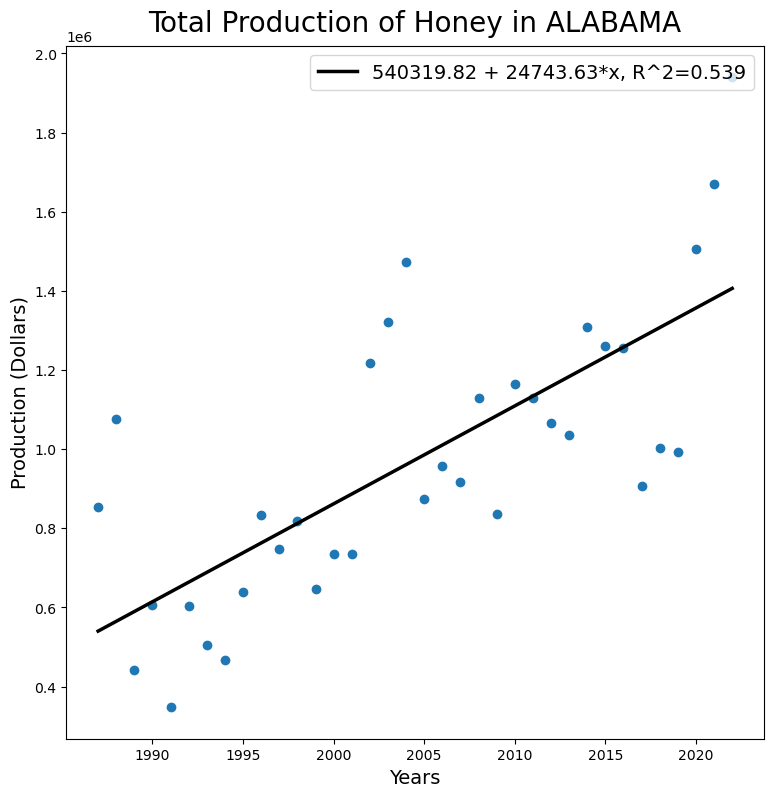

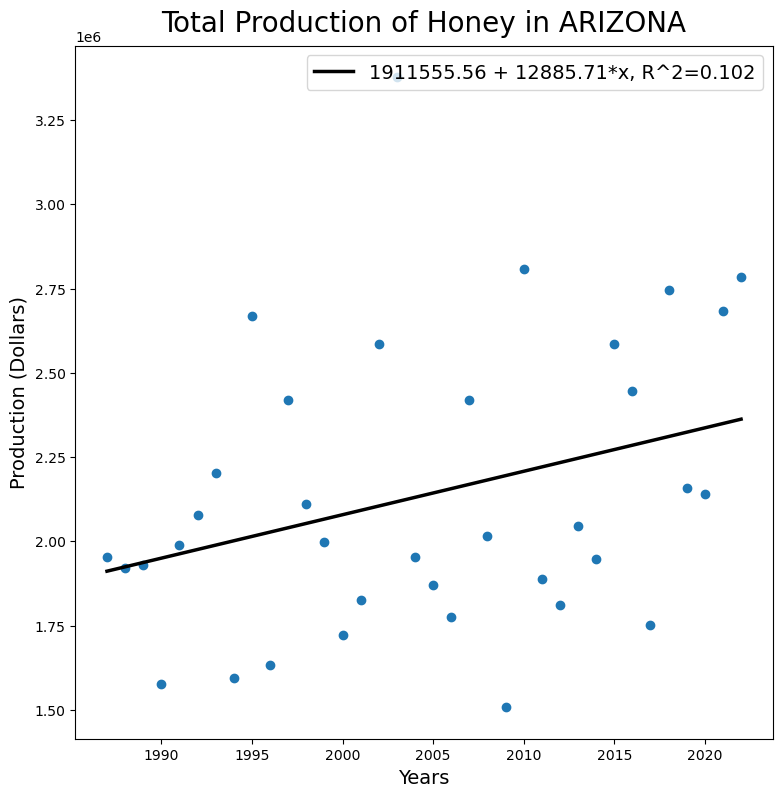

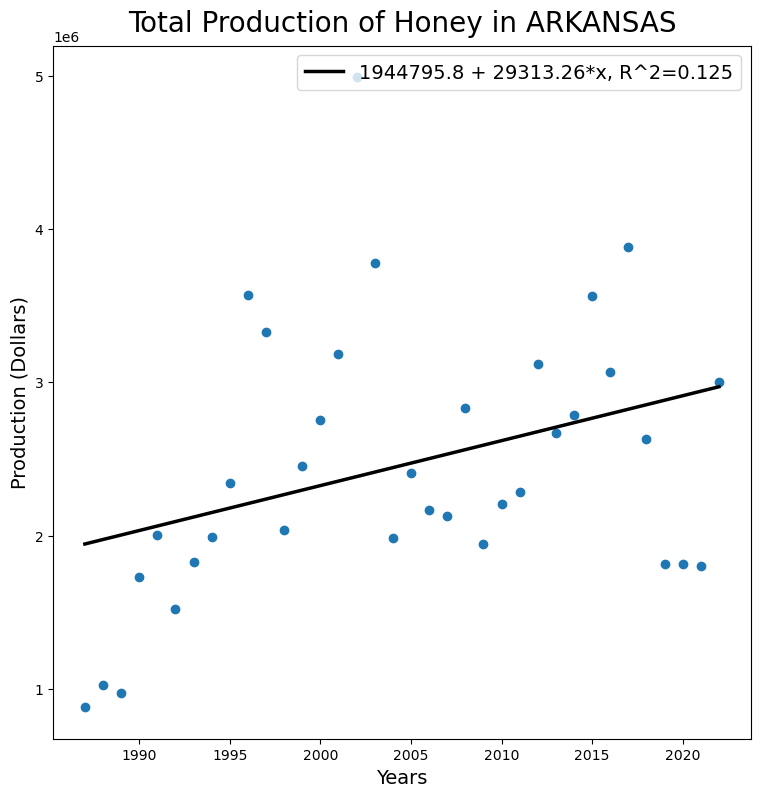

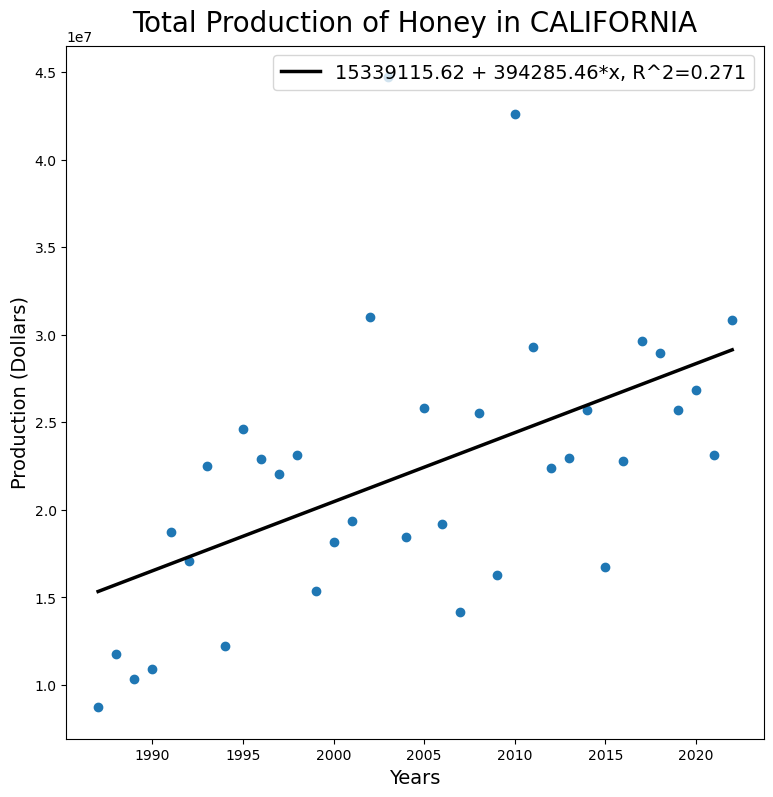

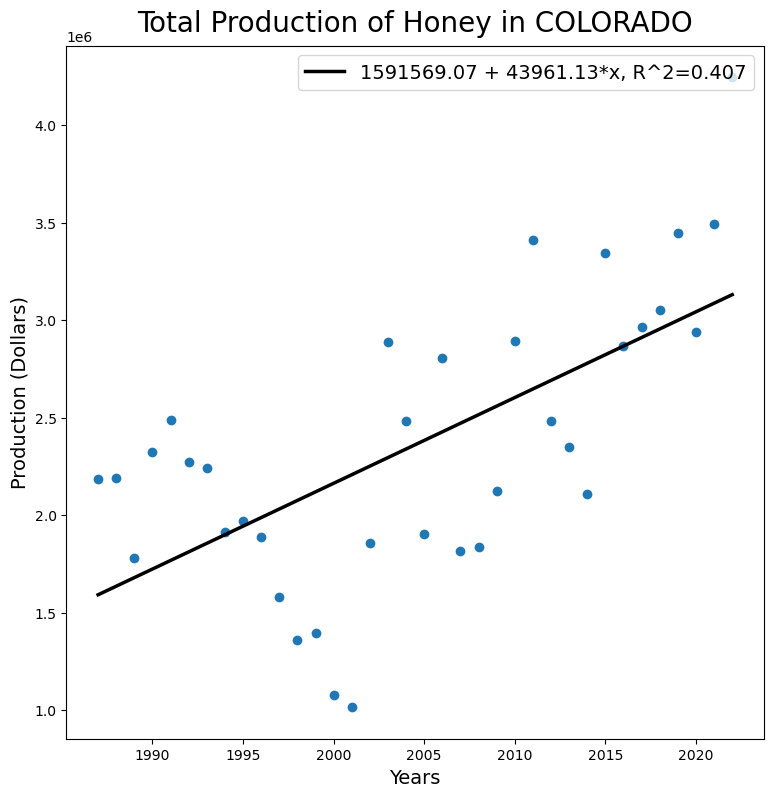

...

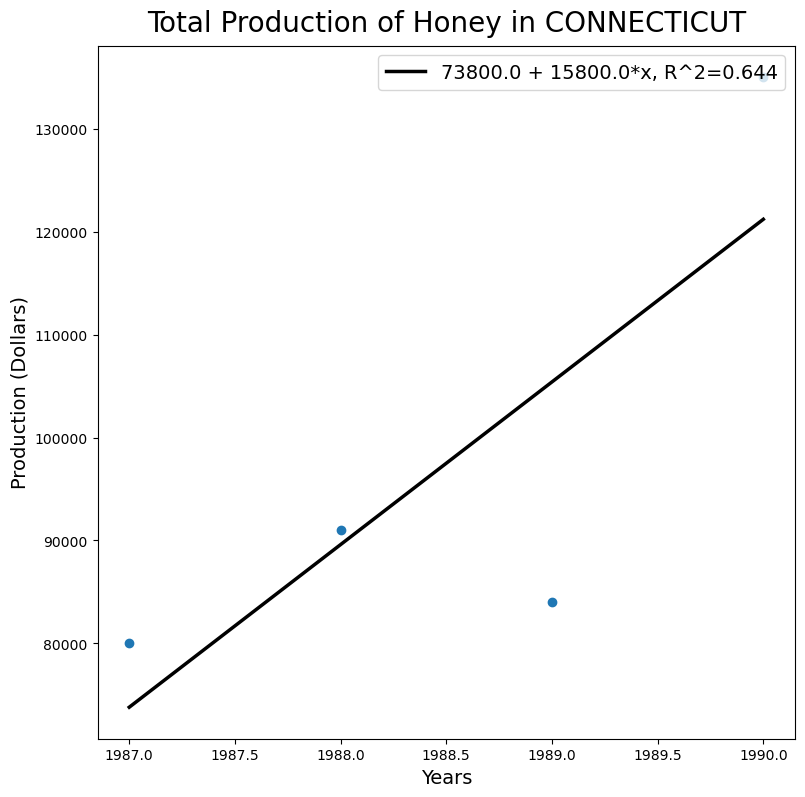

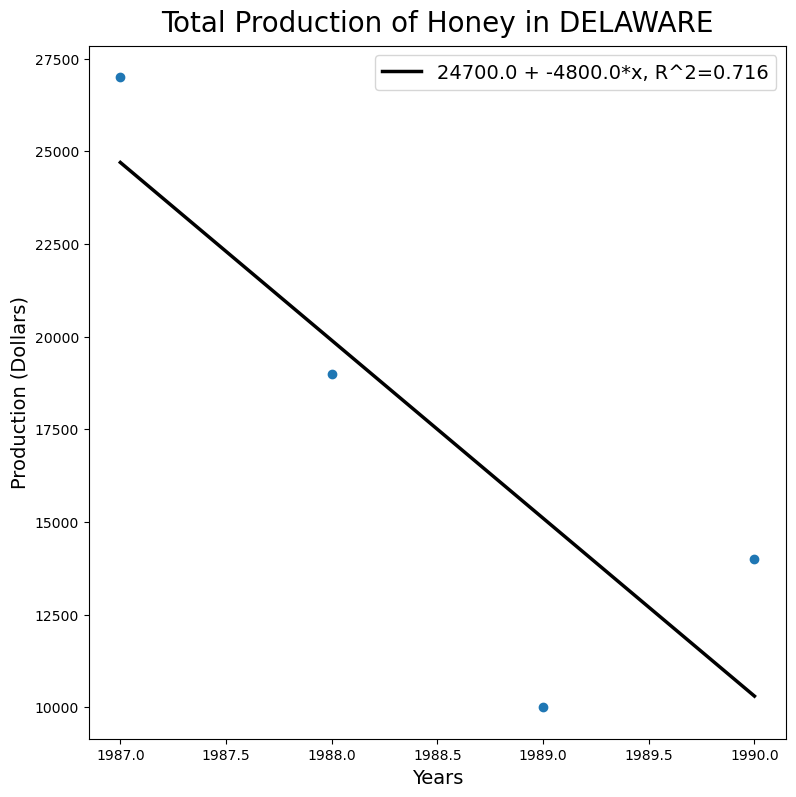

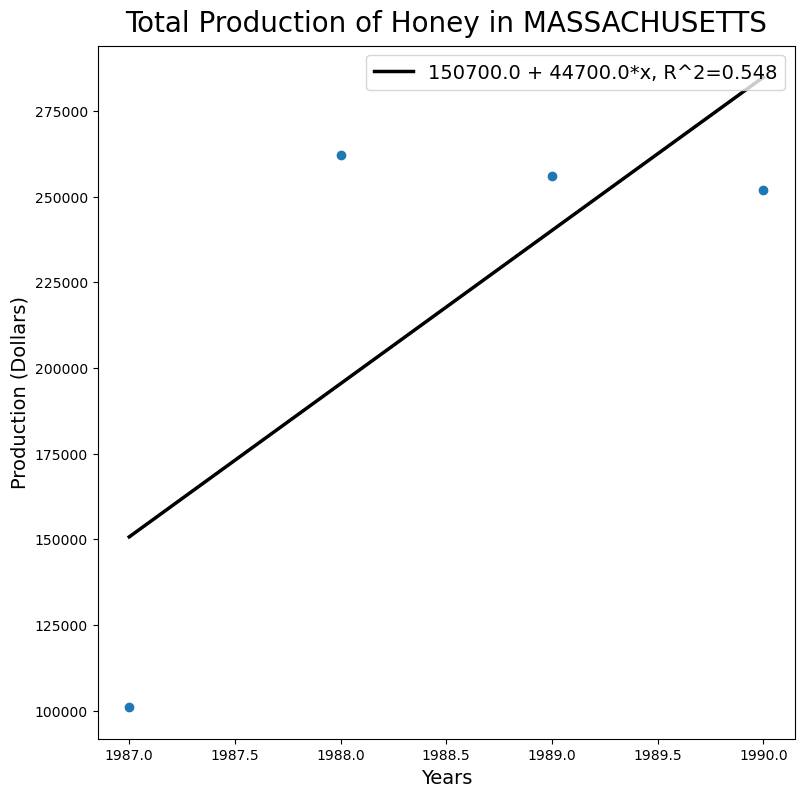

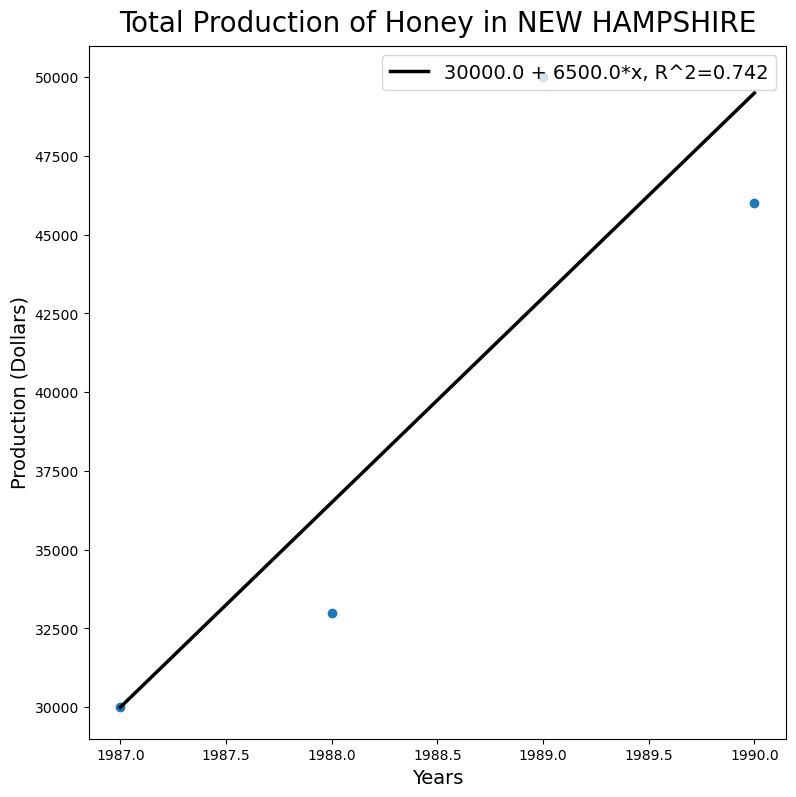

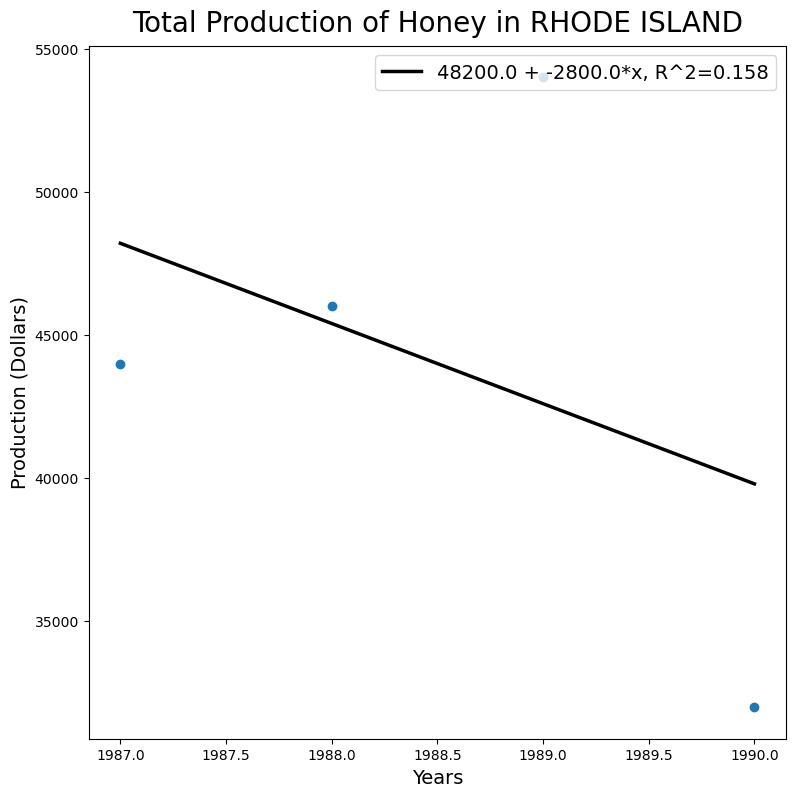

In [10]:
#Creating a scatterplot and line of regression for all states
#Honey Production ($)
states = honey_prod_dollar["State"].unique()


each_stateDollar = pd.DataFrame(columns=['State', 'Beta'])

#looping through each unique state
for state in states:
    #selecting data for a particular state
    prod = honey_prod_dollar[honey_prod_dollar['State'] == state]
    
    
    #creating a plot
    fig, ax = plt.subplots(figsize = (9, 9))

    #plotting a scatterplot
    ax.scatter(x=prod['Year'], y=prod['Value'])

    #calculating line of best fit
    b, a = np.polyfit(prod['Year'], prod['Value'], deg=1)
    beta, alpha = np.polyfit(range(len(prod['Year'])), prod['Value'][::-1], deg=1)
    
    #Calculating R-squared value
    corr_matrix = np.corrcoef(range(len(prod['Year'])), prod['Value'][::-1])
    corr = corr_matrix[0,1]
    R_sq = corr**2
    
    
    #storing the state name and its regression coefficient in a separate dataframe
    row_to_append = pd.DataFrame({'State': state.title(), 'Beta': beta}, index=[0])
    each_stateDollar = pd.concat([each_stateDollar, row_to_append])
    
    #plotting a linear regression line =
    ax.plot(prod['Year'], a + b * prod['Year'], color="k", lw=2.5, label=f'{round(alpha, 2)} + {round(beta, 2)}*x, R^2={round(R_sq, 3)}')

    #Configuring chart labels
    ax.set_title(f"Total Production of Honey in {state}", fontsize=20, verticalalignment='bottom')
    ax.set_xlabel("Years", fontsize=14)
    ax.set_ylabel("Production (Dollars)", fontsize=14)
    ax.legend(loc="upper right", fontsize=14)
    
    #Price of domestic honey is most likely increasing because domestic production has gone down

C:\Users\ahnaf\AppData\Local\Temp\ipykernel_21496\1232632995.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (9, 4))


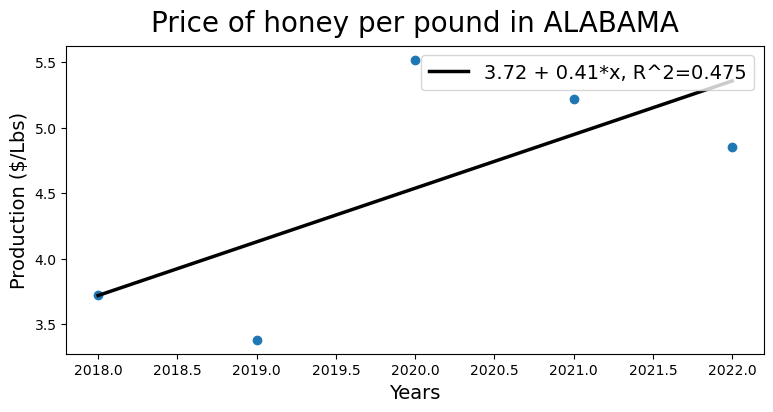

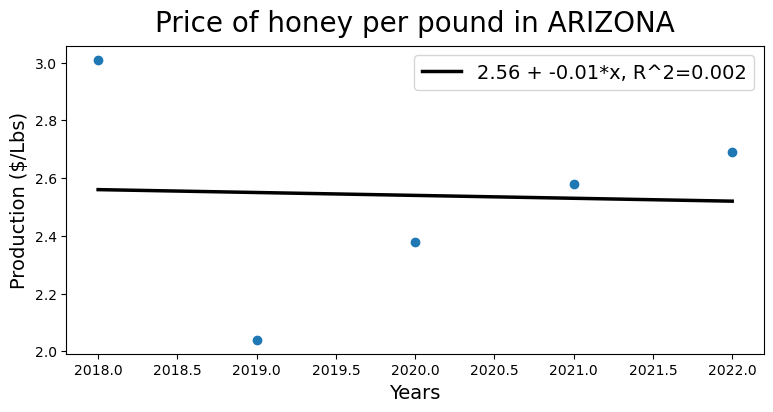

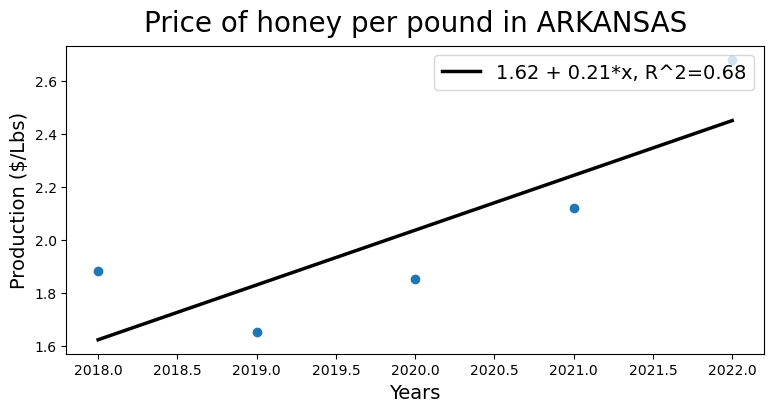

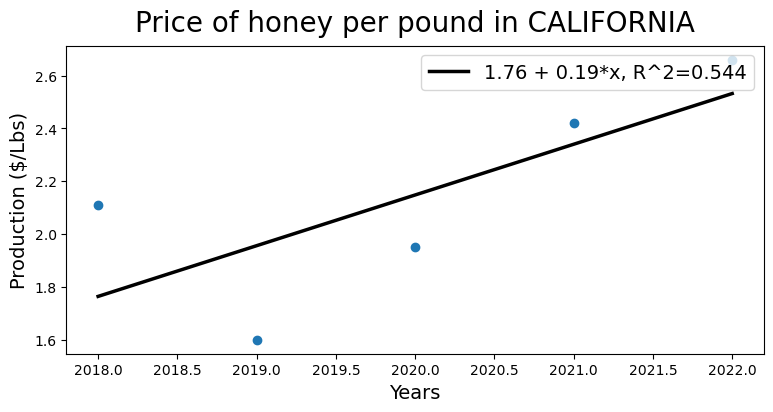

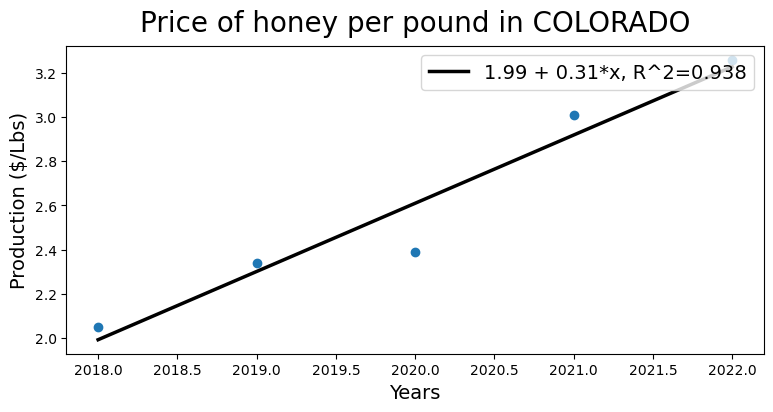

...

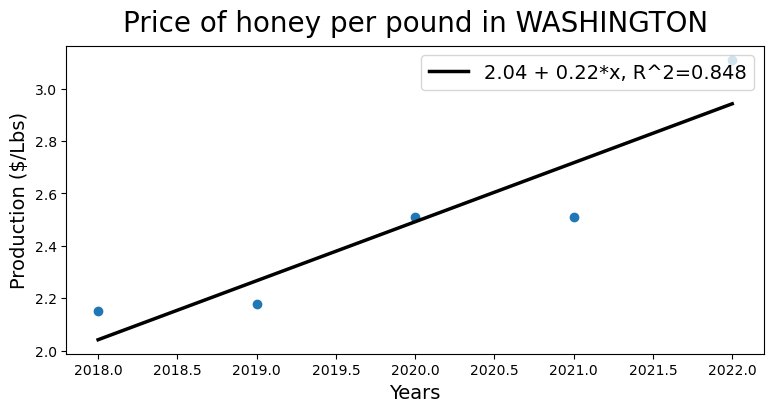

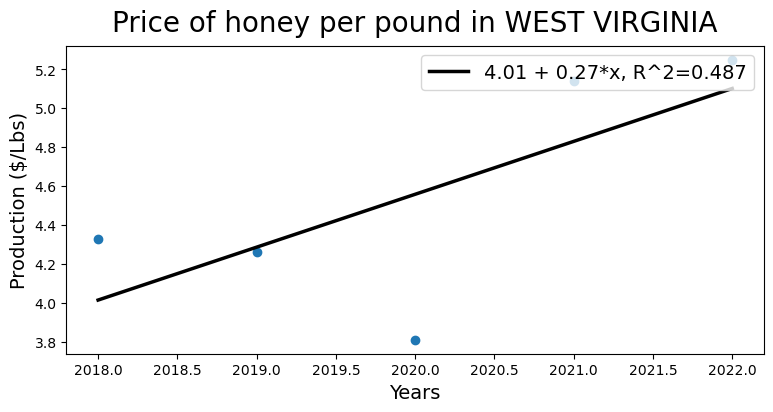

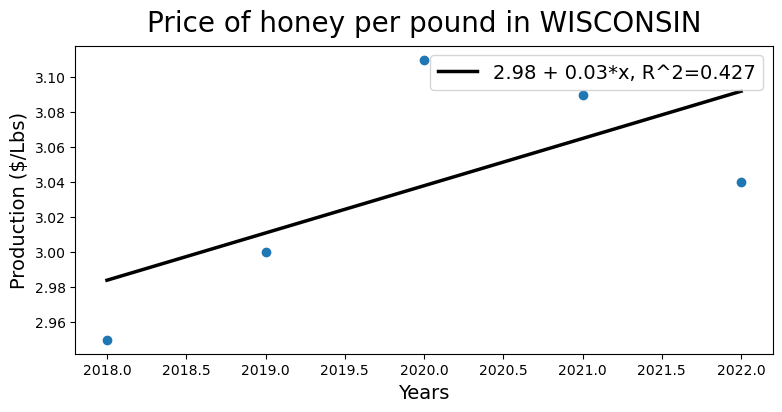

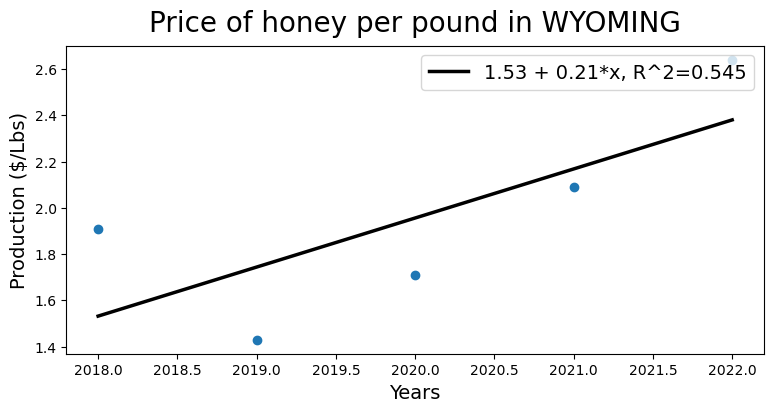

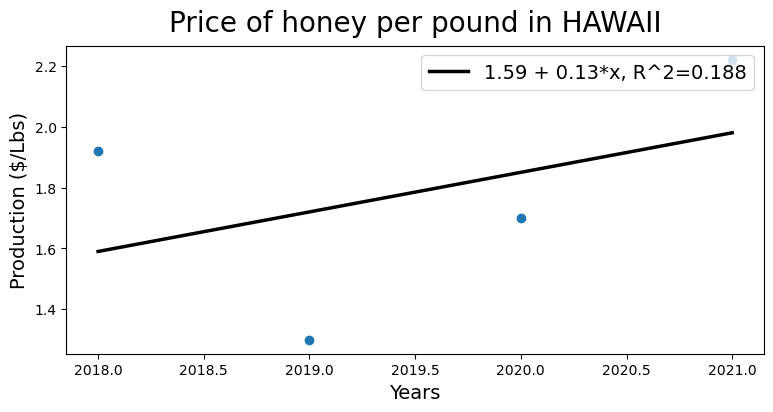

In [11]:
#Creating a scatterplot and line of regression for all states
#Price recieved per pound of honey
states = honey_pricePerPound["State"].unique()


each_statePriceRecieved = pd.DataFrame(columns=['State', 'Beta'])

#looping through each unique state
for state in states:
    #selecting data for a particular state
    prod = honey_pricePerPound[honey_pricePerPound['State'] == state]
    
    
    #creating a plot
    fig, ax = plt.subplots(figsize = (9, 4))

    #plotting a scatterplot
    ax.scatter(x=prod['Year'], y=prod['Value'])

    #calculating line of best fit
    b, a = np.polyfit(prod['Year'], prod['Value'], deg=1)
    beta, alpha = np.polyfit(range(len(prod['Year'])), prod['Value'][::-1], deg=1)
    
    #Calculating R-squared value
    corr_matrix = np.corrcoef(range(len(prod['Year'])), prod['Value'][::-1])
    corr = corr_matrix[0,1]
    R_sq = corr**2
    
    
    #storing the state name and its regression coefficient in a separate dataframe
    row_to_append = pd.DataFrame({'State': state.title(), 'Beta': beta}, index=[0])
    each_statePriceRecieved = pd.concat([each_statePriceRecieved, row_to_append])
    
    #plotting a linear regression line =
    ax.plot(prod['Year'], a + b * prod['Year'], color="k", lw=2.5, label=f'{round(alpha, 2)} + {round(beta, 2)}*x, R^2={round(R_sq, 3)}')

    #Configuring chart labels
    ax.set_title(f"Price of honey per pound in {state}", fontsize=20, verticalalignment='bottom')
    ax.set_xlabel("Years", fontsize=14)
    ax.set_ylabel("Production ($/Lbs)", fontsize=14)
    ax.legend(loc="upper right", fontsize=14)
    
    #Price of domestic honey is most likely increasing because domestic production has gone down

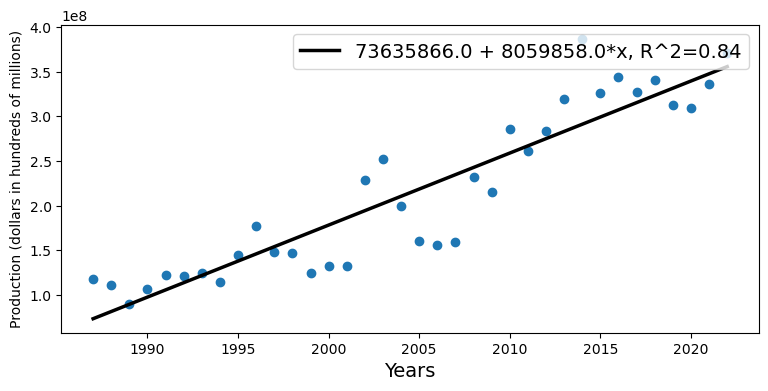

In [31]:
#Creating a scatterplot and line of regression for national honey data
#Production of honey in dollars

    
#creating a plot
fig, ax = plt.subplots(figsize = (9, 4))

#plotting a scatterplot
ax.scatter(x=nhp_dollar['Year'], y=nhp_dollar['Value'])

#calculating line of best fit
b, a = np.polyfit(nhp_dollar['Year'], nhp_dollar['Value'], deg=1)
beta, alpha = np.polyfit(range(len(nhp_dollar['Year'])), nhp_dollar['Value'][::-1], deg=1)
    
#Calculating R-squared value
corr_matrix = np.corrcoef(range(len(nhp_dollar['Year'])), nhp_dollar['Value'][::-1])
corr = corr_matrix[0,1]
R_sq = corr**2
    
#plotting a linear regression line =
ax.plot(nhp_dollar['Year'], a + b * nhp_dollar['Year'], color="k", lw=2.5, label=f'{round(alpha, 0)} + {round(beta, 0)}*x, R^2={round(R_sq, 2)}')

#Configuring chart labels

ax.set_xlabel("Years", fontsize=14)
ax.set_ylabel("Production (dollars in hundreds of millions)", fontsize=10)
ax.legend(loc="upper right", fontsize=14)
    
#Price of domestic honey is most likely increasing because domestic production has gone down

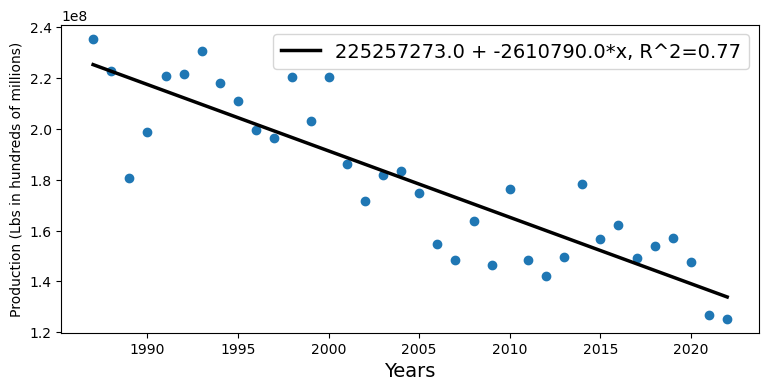

In [27]:
#Creating a scatterplot and line of regression for national honey data
#Production of honey in pounds

    
#creating a plot
fig, ax = plt.subplots(figsize = (9, 4))

#plotting a scatterplot
ax.scatter(x=nhp_Lb['Year'], y=nhp_Lb['Value'])

#calculating line of best fit
b, a = np.polyfit(nhp_Lb['Year'], nhp_Lb['Value'], deg=1)
beta, alpha = np.polyfit(range(len(nhp_Lb['Year'])), nhp_Lb['Value'][::-1], deg=1)
    
#Calculating R-squared value
corr_matrix = np.corrcoef(range(len(nhp_Lb['Year'])), nhp_Lb['Value'][::-1])
corr = corr_matrix[0,1]
R_sq = corr**2
    
#plotting a linear regression line =
ax.plot(nhp_Lb['Year'], a + b * nhp_Lb['Year'], color="k", lw=2.5, label=f'{round(alpha, 0)} + {round(beta, 0)}*x, R^2={round(R_sq, 2)}')

#Configuring chart labels
ax.set_xlabel("Years", fontsize=14)
ax.set_ylabel("Production (Lbs in hundreds of millions)", fontsize=10)
ax.legend(loc="upper right", fontsize=14)
    
#Price of domestic honey is most likely increasing because domestic production has gone down

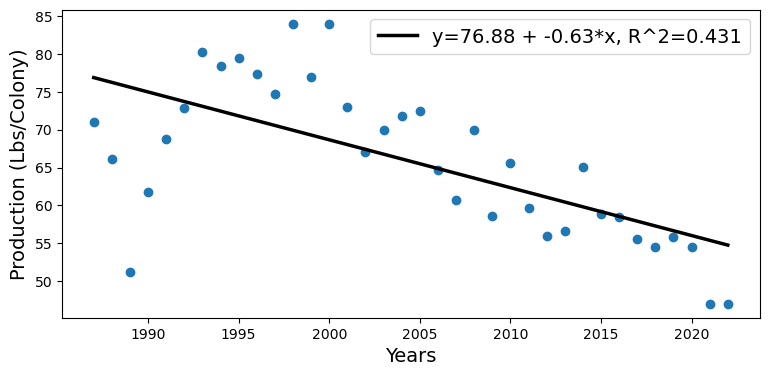

In [19]:
#Creating a scatterplot and line of regression for national honey data
#Production of honey in pounds per colony

    
#creating a plot
fig, ax = plt.subplots(figsize = (9, 4))

#plotting a scatterplot
ax.scatter(x=nhp_LbPerColony['Year'], y=nhp_LbPerColony['Value'])

#calculating line of best fit
b, a = np.polyfit(nhp_LbPerColony['Year'], nhp_LbPerColony['Value'], deg=1)
beta, alpha = np.polyfit(range(len(nhp_LbPerColony['Year'])), nhp_LbPerColony['Value'][::-1], deg=1)
    
#Calculating R-squared value
corr_matrix = np.corrcoef(range(len(nhp_LbPerColony['Year'])), nhp_LbPerColony['Value'][::-1])
corr = corr_matrix[0,1]
R_sq = corr**2
    
#plotting a linear regression line =
ax.plot(nhp_LbPerColony['Year'], a + b * nhp_LbPerColony['Year'], color="k", lw=2.5, label=f'y={round(alpha, 2)} + {round(beta, 2)}*x, R^2={round(R_sq, 3)}')

#Configuring chart labels
ax.set_xlabel("Years", fontsize=14)
ax.set_ylabel("Production (Lbs/Colony)", fontsize=14)
ax.legend(loc="upper right", fontsize=14)
    
#General Productivity of bee colonies have gone down

In [15]:
#Saving the regression coefficients of each state to visualize on a map
each_stateLbPerColony.to_csv('LbPerColony.csv')
each_stateLbs.to_csv('Lbs.csv')
each_stateDollar.to_csv('Dollars.csv')
each_statePriceRecieved.to_csv('DollarsPerPound.csv')